<a href="https://colab.research.google.com/github/SergioMontesinos/CGAN_and_StyleGAN_comparison/blob/main/CGAN_and_StyleGAN_comparison.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install keras


In [ ]:
import tensorflow as tf
import os
import time
import numpy as np 
from matplotlib import pyplot as plt
from IPython import display

In [ ]:
pip install -q -U tensorboard

In [ ]:
!nvidia-smi


Mon Dec 28 15:22:21 2020       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.27.04    Driver Version: 418.67       CUDA Version: 10.1     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla V100-SXM2...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   32C    P0    23W / 300W |      0MiB / 16130MiB |      0%      Default |
|                               |                      |                 ERR! |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
#_URL = 'https://people.eecs.berkeley.edu/~tinghuiz/projects/pix2pix/datasets/edges2shoes.tar.gz'

#path_to_zip = tf.keras.utils.get_file('edges2shoes.tar.gz',origin=_URL,extract=True)

#PATH = os.path.join(os.path.dirname(path_to_zip), 'edges2shoes/')
#print(PATH)

#_URL = '/content/drive/MyDrive/Colab Notebooks/mydataset.7z'
#! git clone https://gitlab.com/SERG1O/datasetgit.git 
#path_to_zip = tf.keras.utils.get_file('mydataset.7z',origin=_URL,extract=True)
#PATH = os.path.join(os.path.dirname(path_to_zip), 'mydataset/')
#print(PATH)

In [ ]:
#! ls
#_URL = 'https://gitlab.com/SERG1O/datasetgit.git'
#path_to_zip = tf.keras.utils.get_file('mydataset.7z',origin=_URL,extract=True)
#PATH = os.path.join(os.path.dirname(path_to_zip), 'mydataset/')

In [ ]:
import keras
train_path = '/content/drive/MyDrive/Colab Notebooks/mydataset/train'
test_path = '/content/drive/MyDrive/Colab Notebooks/mydataset/test'


In [ ]:
BUFFER_SIZE = 700
BATCH_SIZE = 1
IMG_WIDTH = 512
IMG_HEIGHT = 512

In [ ]:
# function to load images and return them
def load(image_file):
  image = tf.io.read_file(image_file) #carga desde disk
  image = tf.image.decode_jpeg(image)# decodificamos a jpeg
  print(image.shape)
  w= tf.shape(image)[1]
  w = w//2 
  input_image = image[:,:w,:]
  real_image = image[:,w:,:]

# casteo a  float , para hacer calculos
  input_image = tf.cast(input_image,tf.float32)  
  real_image= tf.cast(real_image,tf.float32) 
  return  real_image,input_image

(1024, 2048, 3)
(1024, 1024, 3)
(1024, 1024, 3)


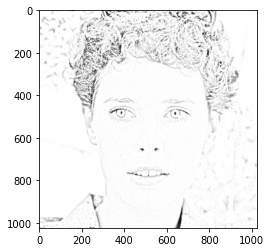

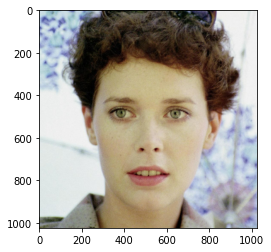

In [ ]:
inp, re = load (train_path+'/s100.jpg')
#print(PATH)
print(inp.shape)
print(re.shape)
plt.figure()
plt.imshow(inp/255.0)
plt.figure()
plt.imshow(re/255.0)

In [ ]:
# function to resize images,we enter the images and the new sizes
def resize(input_image,real_image,height,width):
  input_image = tf.image.resize(input_image, [height,width],
                                method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
  # Neareast_neighborhood is a resize algorithm that aproximate the new pixel to the closest ones
  real_image = tf.image.resize(real_image,[height,width],
                              method = tf.image.ResizeMethod.NEAREST_NEIGHBOR)
  return input_image, real_image

In [ ]:
#funcion que coge una parte de las imagenes pasads como parametros
def random_crop(input_image, real_image):
  stacked_image = tf.stack([input_image,real_image],axis=0)
  cropped_image = tf.image.random_crop(
      stacked_image,size=[2,IMG_HEIGHT,IMG_WIDTH,3]) # the size is defiend 256
  return cropped_image[0], cropped_image[1]

In [ ]:
# we want the images to be in a [-1,1]range to easy the math and learning
def normalize(input_image,real_image):
  input_image = (input_image/127.5)-1
  real_image = (real_image/127.5)-1
  #print([np.amin(input_image),np.amax(input_image)])
  return input_image, real_image

In [ ]:
# Funcion que se utiliza para aumentar los datos. Aplicando esta fucnion se 
# generan virtualmente mas imagenes o base de ampliar las imagenes y desplazarlas (voltearlas)
@tf.function()
def random_jitter(input_image,real_image):
  # aumentamos el tamaño 286 x 286 x 3 (canales de color)
  input_image, real_image = resize(input_image, real_image,IMG_WIDTH+60,IMG_HEIGHT+60)
  # cogemos una parte de la imagen (256 x 256 x 3) anteriormente ampliada .
  input_image, real_image = random_crop(input_image,real_image)

  if tf.random.uniform(())> 0.5:
    # Volteamos la imagen horizontalmente
    input_image = tf.image.flip_left_right(input_image)
    real_image = tf.image.flip_left_right(real_image)
  return input_image, real_image

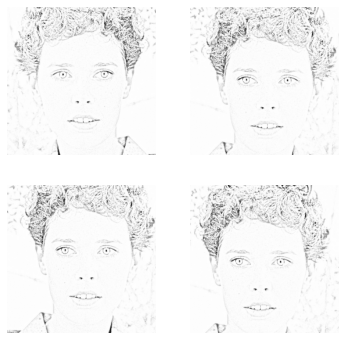

In [ ]:
#As you can see in the images below that they are going through random jittering
#Random jittering as described in the paper is to
#Resize an image to bigger height and width
#Randomly crop to the target size
#Randomly flip the image horizontally
plt.figure(figsize=(6, 6))
for i in range(4):
  rj_inp, rj_re = random_jitter(inp, re)
  plt.subplot(2, 2, i+1)
  plt.imshow(rj_inp/256.0)
  plt.axis('off')
plt.show()

In [ ]:
#funcion para cargar imagenes de entrenamiento
def load_image_train(image_file):
  input_image, real_image = load(image_file)
  #input_image, real_image = resize(input_image, real_image,IMG_HEIGHT, IMG_WIDTH)
  input_image, real_image = random_jitter(input_image, real_image)
  input_image, real_image = normalize(input_image, real_image)

  return input_image, real_image

In [ ]:
#funcion para cargar imagen de test. no aplicamos el aumento
# de datos
def load_image_test(image_file):
  input_image, real_image = load(image_file)
  input_image, real_image = resize(input_image, real_image,
                                   IMG_HEIGHT, IMG_WIDTH)
  input_image, real_image = normalize(input_image, real_image)

  return input_image, real_image

In [ ]:
#INPUT PIPELINE
#cargamos las imagenes de entrenamiento en un dataset
train_dataset = tf.data.Dataset.list_files(train_path+'/*.jpg').take(BUFFER_SIZE)
#data.experimental.Autotune ---> Permite que sea el propio TS
#  el que ajuste el numero de hilos en paralelo
train_dataset = train_dataset.map(load_image_train,
                                  num_parallel_calls=tf.data.experimental.AUTOTUNE)
train_dataset = train_dataset.shuffle(BUFFER_SIZE)
train_dataset = train_dataset.batch(BATCH_SIZE)



(None, None, None)


In [ ]:
#for im1,im2 in train_dataset.take(3):
#  plt.imshow(((im1[0,...])+1))
#  plt.imshow(((im2[0,...])+1))
#  plt.show()
#print(len(train_dataset))

In [ ]:
test_dataset = tf.data.Dataset.list_files(test_path+'/*.jpg').take(300)
test_dataset = test_dataset.map(load_image_test)
test_dataset = test_dataset.batch(BATCH_SIZE)
print( len(test_dataset) )

(None, None, None)
300


# **Construir el Generador**
* The architecture of generator is a modified U-Net.
* Each block in the encoder is (Conv -> Batchnorm -> Leaky ReLU)
* Each block in the decoder is (Transposed Conv -> Batchnorm -> Dropout(applied to the first 3 blocks) -> ReLU)
* There are skip connections between the encoder and decoder (as in U-Net).

In [ ]:
OUTPUT_CHANNELS = 3

In [ ]:
# Cada  bloque en le codificador es (Conv   -> Batchnorm       -> ReLU)
#                                 (Convolution-->Normalizacion-->Activacion)
# Funcion para generar los bloques de neustro codificador:
# ENCODER
def downsample(filters, size, apply_batchnorm=True):
  initializer = tf.random_normal_initializer(0., 0.02)

  result = tf.keras.Sequential()
  #Capa convolucional
  result.add(tf.keras.layers.Conv2D(filters, size, strides=2, padding='same',
                             kernel_initializer=initializer, use_bias=False))
  #Capa de normalizacion
  if apply_batchnorm:
    result.add(tf.keras.layers.BatchNormalization())

  # añadimos capa activacion
  result.add(tf.keras.layers.LeakyReLU())

  return result

In [ ]:
down_model = downsample(3, 4)
down_result = down_model(tf.expand_dims(inp, 0))
print (down_result.shape)

(1, 512, 512, 3)


In [ ]:
# Cada bloque en nuetro decodificador es (Transposed Conv-> Batchnorm ->Dropout ->ReLU)
# DECODER
def upsample(filters, size, apply_dropout=False):
  initializer = tf.random_normal_initializer(0., 0.02)

  result = tf.keras.Sequential()
  # Capa convolucional
  result.add(tf.keras.layers.Conv2DTranspose(filters, size, strides=2,
                                    padding='same',
                                    kernel_initializer=initializer,
                                    use_bias=False))
  # Capa Normalizacion
  result.add(tf.keras.layers.BatchNormalization())
  # Capa de Dropout
  if apply_dropout:
      result.add(tf.keras.layers.Dropout(0.5))
  # Capa de Activacion
  result.add(tf.keras.layers.ReLU())

  return result

In [ ]:
up_model = upsample(3, 4)
up_result = up_model(down_result)
print (up_result.shape)

(1, 1024, 1024, 3)


In [ ]:
def Generator():
  inputs = tf.keras.layers.Input(shape=[512,512,3])

  down_stack = [
    downsample(64, 4, apply_batchnorm=False), # (bs, 128, 128, 64)
    downsample(128, 4), # (bs, 64, 64, 128)
    downsample(256, 4), # (bs, 32, 32, 256)
    downsample(512, 4), # (bs, 16, 16, 512)
    downsample(512, 4), # (bs, 8, 8, 512)
    downsample(512, 4), # (bs, 4, 4, 512)
    downsample(512, 4), # (bs, 2, 2, 512)
    downsample(512, 4), # (bs, 1, 1, 512)
   # downsample(512, 4), # (bs, 1, 1, 512)
  ]

  up_stack = [
    upsample(512, 4, apply_dropout=True), # (bs, 2, 2, 1024)
    upsample(512, 4, apply_dropout=True), # (bs, 4, 4, 1024)
    upsample(512, 4, apply_dropout=True), # (bs, 8, 8, 1024)
    upsample(512, 4), # (bs, 16, 16, 1024)
    upsample(256, 4), # (bs, 32, 32, 512)
    upsample(128, 4), # (bs, 64, 64, 256)
    upsample(64, 4), # (bs, 128, 128, 128)
   # upsample(32, 4), # (bs, 128, 128, 128)
  ]

  initializer = tf.random_normal_initializer(0., 0.02)
  last = tf.keras.layers.Conv2DTranspose(OUTPUT_CHANNELS, 4,
                                         strides=2,
                                         padding='same',
                                         kernel_initializer=initializer,
                                         activation='tanh') # (bs, 256, 256, 3)

  x = inputs

  # Downsampling through the model
  skips = []
  for down in down_stack:
    x = down(x)
    skips.append(x)

  skips = reversed(skips[:-1])

  # Upsampling and establishing the skip connections
  for up, skip in zip(up_stack, skips):
    x = up(x)
    x = tf.keras.layers.Concatenate()([x, skip])

  x = last(x)

  return tf.keras.Model(inputs=inputs, outputs=x)

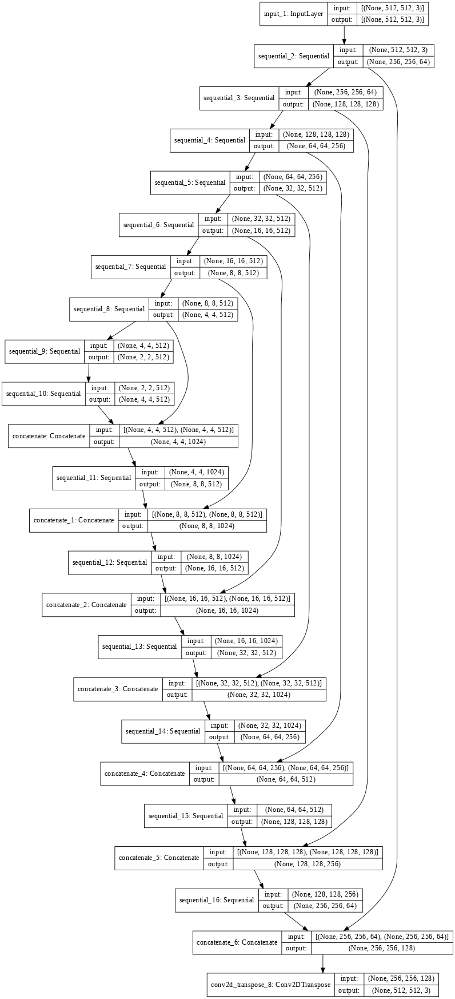

In [ ]:
generator = Generator()
tf.keras.utils.plot_model(generator, show_shapes=True, dpi=64)

In [ ]:
#gen_output = generator(inp[tf.newaxis,...], training=False)
#plt.imshow(gen_output[0,...])

In [ ]:
LAMBDA = 100

In [ ]:
def generator_loss(disc_generated_output, gen_output, target):
  gan_loss = loss_object(tf.ones_like(disc_generated_output), disc_generated_output)

  # mean absolute error
  l1_loss = tf.reduce_mean(tf.abs(target - gen_output))

  total_gen_loss = gan_loss + (LAMBDA * l1_loss)

  return total_gen_loss, gan_loss, l1_loss

In [ ]:
#El discriminador observara el resultado generado y nos dira si es cierto o falso 
#en ralacion a lo que el considera una imagen correcta.

# El discriminador en este caso es una PatchGAN --> En vez de devolver cierto o falso devuelve una 
# cuadricula en el que nos dice por si el trozo de imagen corespondiente a cada cuadricula es 
# verdadero o falso

def Discriminator():
  initializer = tf.random_normal_initializer(0., 0.02)
  input_shape = 512
  inp = tf.keras.layers.Input(shape=[input_shape, input_shape, 3], name='input_image')#imagen in real
  tar = tf.keras.layers.Input(shape=[input_shape, input_shape, 3], name='target_image')# Imagen del generador
  #concatenamos las dos entradas
  x = tf.keras.layers.concatenate([inp, tar]) # (bs, 256, 256, channels*2)
  #Construimos los distintos bloques
  down1 = downsample(64, 4, False)(x) # (bs, 128, 128, 64)
  down2 = downsample(128, 4)(down1) # (bs, 64, 64, 128)
  down3 = downsample(256, 4)(down2) # (bs, 32, 32, 256)
  down4 = downsample(512, 4)(down3) # (bs, 32, 32, 256)

  zero_pad1 = tf.keras.layers.ZeroPadding2D()(down4) # (bs, 34, 34, 256)
  #Añadimos  la capa convolucional 
  conv = tf.keras.layers.Conv2D(1024, 4, strides=1,
                                kernel_initializer=initializer,
                                use_bias=False)(zero_pad1) # (bs, 31, 31, 512)
  #capa de batchnorm
  batchnorm1 = tf.keras.layers.BatchNormalization()(conv)
  #capa relu 
  leaky_relu = tf.keras.layers.LeakyReLU()(batchnorm1)

  zero_pad2 = tf.keras.layers.ZeroPadding2D()(leaky_relu) # (bs, 33, 33, 512)
  # Ultima capa con unico filtro de salida con un canal donde nos dice por cada pixel
  # de la imagen si parece real o no
  last = tf.keras.layers.Conv2D(1, 4, strides=1,
                                kernel_initializer=initializer)(zero_pad2) # (bs, 30, 30, 1)
  #devolvemos el modelo del discriminador
  return tf.keras.Model(inputs=[inp, tar], outputs=last)

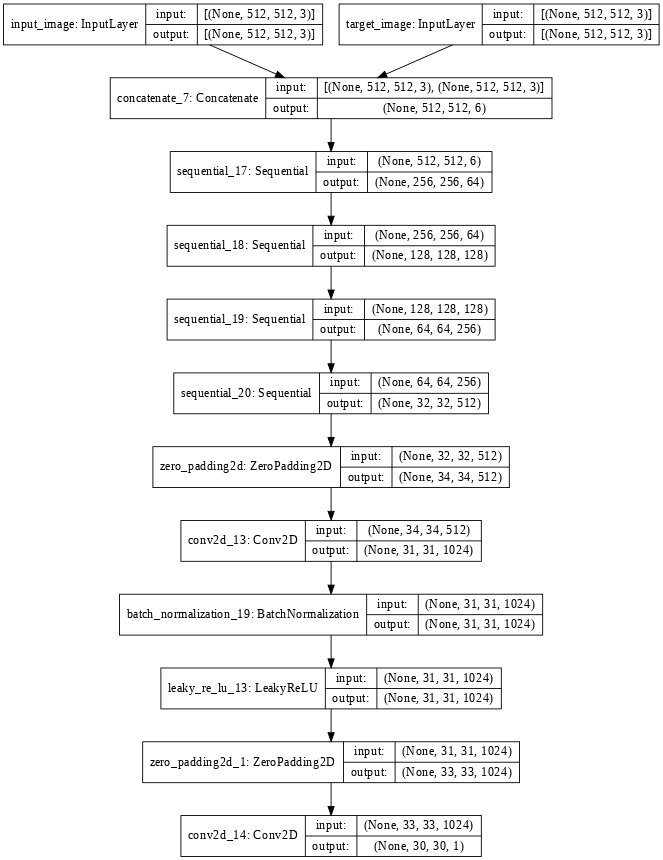

In [ ]:
#comprueba que todo funciona
discriminator = Discriminator()
tf.keras.utils.plot_model(discriminator, show_shapes=True, dpi=64)

In [ ]:
#Pasamos dos imagenes y vemos un posible reusltado.
#disc_out = discriminator([inp[tf.newaxis,...], gen_output], training=False)
#plt.imshow(disc_out[0,...,-1], vmin=-20, vmax=20, cmap='RdBu_r')
#plt.colorbar()

In [ ]:
loss_object = tf.keras.losses.BinaryCrossentropy(from_logits=True)

In [ ]:
#funcion para evaluar el comportamiento del discriminador
def discriminator_loss(disc_real_output, disc_generated_output):
  #Diferencia entre la observacion de una imagen real y una matriz con todo a unos(representa
  #que la imagen es real)
  real_loss = loss_object(tf.ones_like(disc_real_output), disc_real_output)
  #Difernecia entre la observacion de una imagen generada y una matriz de todo a cero(representa
  #que la imagen  es fake)
  generated_loss = loss_object(tf.zeros_like(disc_generated_output), disc_generated_output)
  #La suma evalua el comportaminento del discriminador
  total_disc_loss = real_loss + generated_loss
  return total_disc_loss

In [ ]:
generator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

In [ ]:
checkpoint_dir = './training_checkpoints'
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer,
                                 generator=generator,
                                 discriminator=discriminator)

In [ ]:
#Con la siguiente funcion evaluamos el comportamiento del modelo generador que estamos
# entrenando le pasamos  imagnes de nuestro conjunto de prueba.
def generate_images(model, test_input, tar):
  prediction = model(test_input, training=True)
  plt.figure(figsize=(25,25))
  display_list = [test_input[0], tar[0], prediction[0]]
  title = ['Input Image', 'Ground Truth', 'Predicted Image']

  for i in range(3):
    plt.subplot(1, 3, i+1)
    plt.title(title[i])
    # getting the pixel values between [0, 1] to plot it.
    plt.imshow(display_list[i] * 0.5 + 0.5)
    plt.axis('off')
  plt.show()

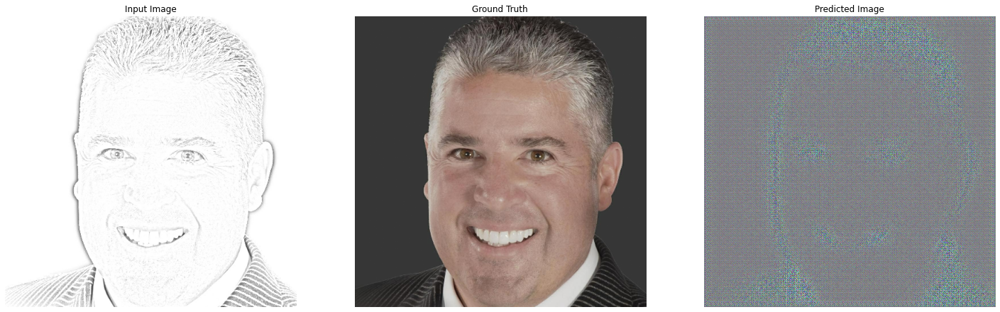

In [ ]:
for example_input, example_target in test_dataset.take(1):
  generate_images(generator, example_input, example_target)

In [ ]:
EPOCHS = 200

In [ ]:
import datetime
log_dir="logs/"

summary_writer = tf.summary.create_file_writer(
  log_dir + "fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))

In [ ]:
!nvidia-smi

Mon Dec 28 15:22:44 2020       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.27.04    Driver Version: 418.67       CUDA Version: 10.1     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla V100-SXM2...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   34C    P0    48W / 300W |   9057MiB / 16130MiB |      0%      Default |
|                               |                      |                 ERR! |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
#Funcion que enlaza todos los modulos implementados
@tf.function
def train_step(input_image, target, epoch):
  with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
    #El generador toma la imagen de entrada de la funcion. Esta imagen es comprimida por 
    # el encoder y descomprimida por el decoder y obtenemos imagen de salida
    gen_output = generator(input_image, training=True)

    # El discriminador observa lo que ha generado el generador y obtenemos
    # la salida del discriminador
    disc_real_output = discriminator([input_image, target], training=True)
    disc_generated_output = discriminator([input_image, gen_output], training=True)

    #Llamamos a las funciones generator_loss y discriminator_loss, que evaluan 
    # el comportamiento del generador y del discrminador
    gen_total_loss, gen_gan_loss, gen_l1_loss = generator_loss(disc_generated_output, gen_output, target)
    disc_loss = discriminator_loss(disc_real_output, disc_generated_output)
  
  # Variable para guardar los gradientes del generador
  generator_gradients = gen_tape.gradient(gen_total_loss,
                                          generator.trainable_variables)
  
  # variable para guardar los gradientes del discriminador
  discriminator_gradients = disc_tape.gradient(disc_loss,
                                               discriminator.trainable_variables)
 #Optimizamos
  generator_optimizer.apply_gradients(zip(generator_gradients,
                                          generator.trainable_variables))
  discriminator_optimizer.apply_gradients(zip(discriminator_gradients,
                                              discriminator.trainable_variables))

  with summary_writer.as_default():
    tf.summary.scalar('gen_total_loss', gen_total_loss, step=epoch)
    tf.summary.scalar('gen_gan_loss', gen_gan_loss, step=epoch)
    tf.summary.scalar('gen_l1_loss', gen_l1_loss, step=epoch)
    tf.summary.scalar('disc_loss', disc_loss, step=epoch)

In [ ]:
# Definimos la rutina de entrenamiento en la siguiente funcion
# A la funcion le pasamos los dataset de entrenamiento y de test y el numero de epocas
def fit(train_ds, epochs, test_ds):
  for epoch in range(epochs):
    start = time.time()

    #Bucle para el entrenamiento
    display.clear_output(wait=True)

    for example_input, example_target in test_ds.take(1):
      generate_images(generator, example_input, example_target)
    print("Epoch: ", epoch)

    # Train
    for n, (input_image, target) in train_ds.enumerate():
      print('.', end='')
      if (n+1) % 100 == 0:
        print()
      train_step(input_image, target, epoch)
    print()

    # Cada 20 epocas salvamos el modelo
    if (epoch + 1) % 20 == 0:
      checkpoint.save(file_prefix = checkpoint_prefix)

    print ('Time taken for epoch {} is {} sec\n'.format(epoch + 1,
                                                        time.time()-start))
  checkpoint.save(file_prefix = checkpoint_prefix)

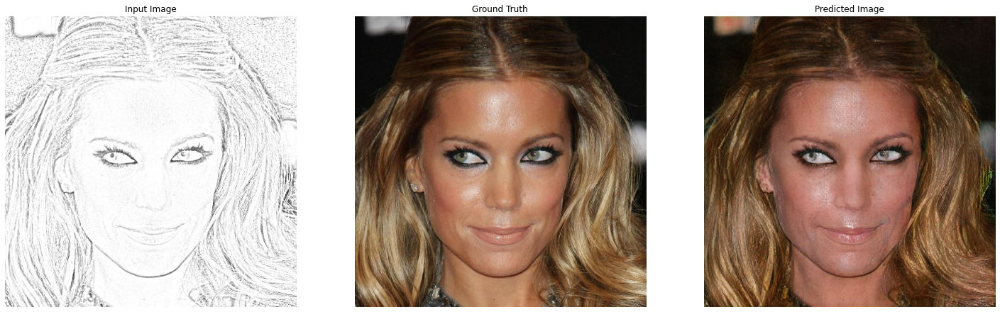

Epoch:  199
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................

Time taken for epoch 200 is 67.40708017349243 sec



In [ ]:
fit(train_dataset, EPOCHS, test_dataset)

In [ ]:
!ls {checkpoint_dir}

checkpoint		     ckpt-4.index
ckpt-10.data-00000-of-00001  ckpt-5.data-00000-of-00001
ckpt-10.index		     ckpt-5.index
ckpt-11.data-00000-of-00001  ckpt-6.data-00000-of-00001
ckpt-11.index		     ckpt-6.index
ckpt-1.data-00000-of-00001   ckpt-7.data-00000-of-00001
ckpt-1.index		     ckpt-7.index
ckpt-2.data-00000-of-00001   ckpt-8.data-00000-of-00001
ckpt-2.index		     ckpt-8.index
ckpt-3.data-00000-of-00001   ckpt-9.data-00000-of-00001
ckpt-3.index		     ckpt-9.index
ckpt-4.data-00000-of-00001


In [ ]:
checkpoint.restore(tf.train.latest_checkpoint(checkpoint_dir))

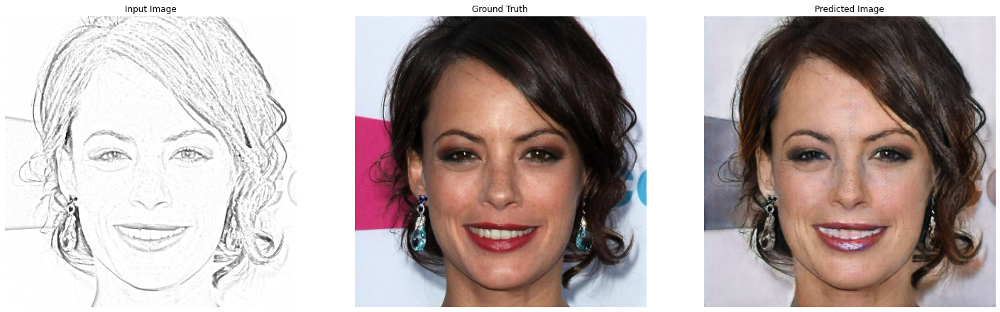

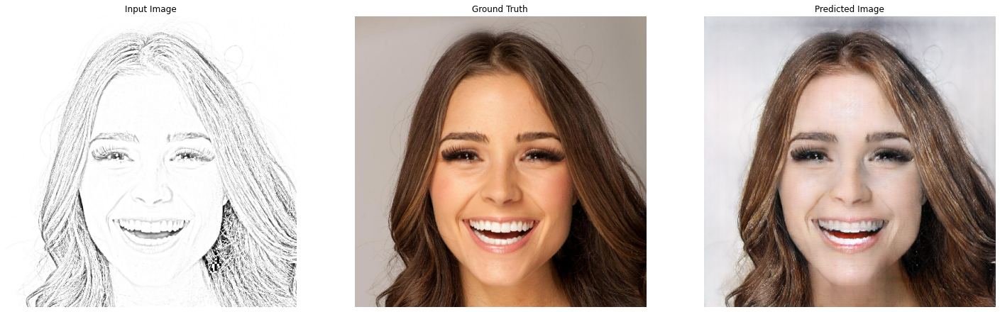

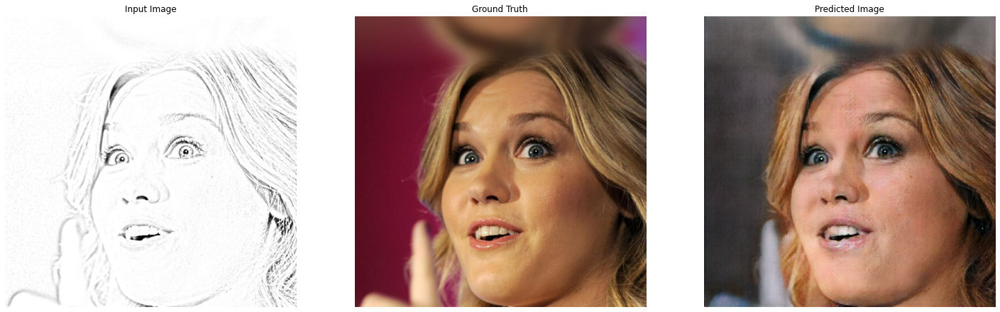

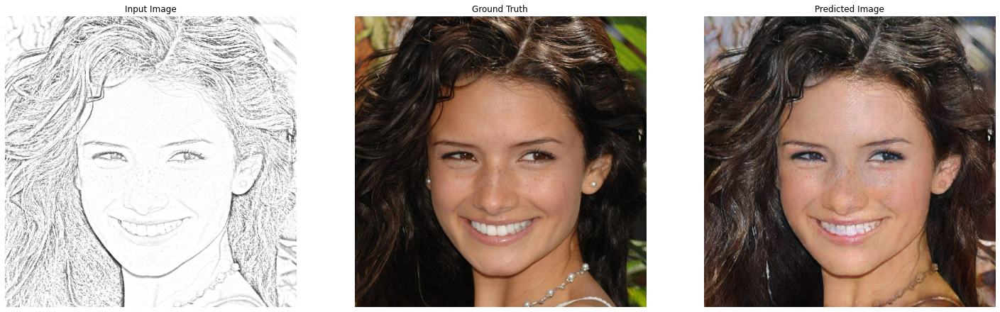

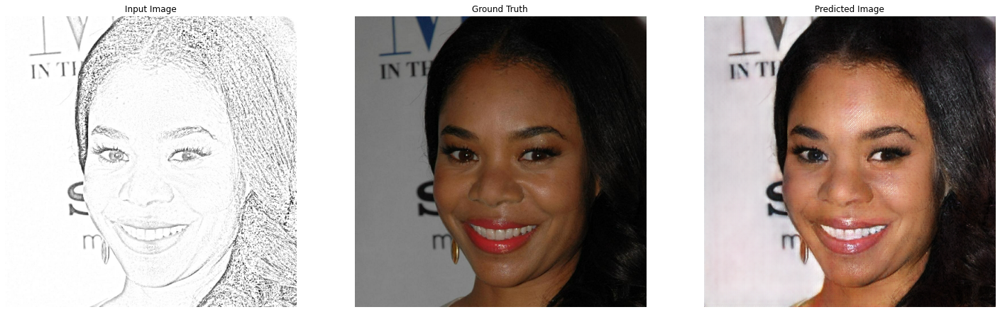

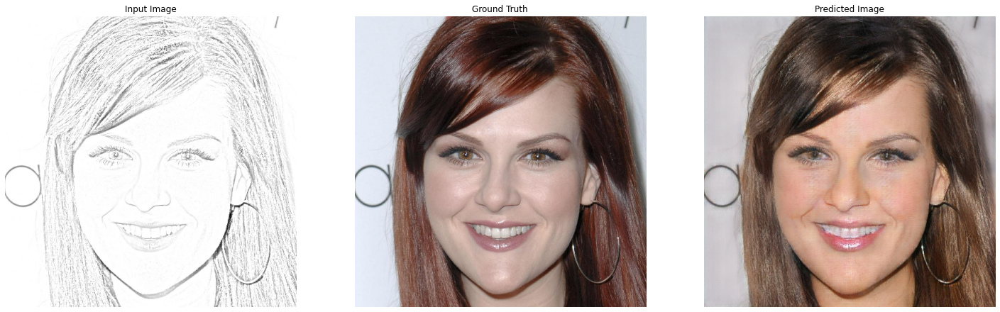

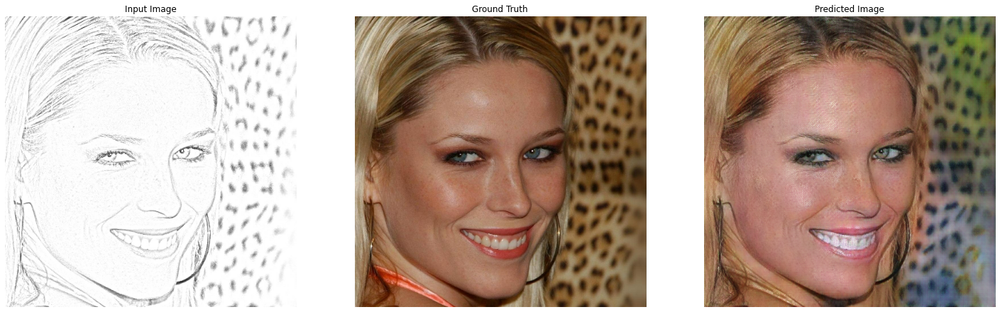

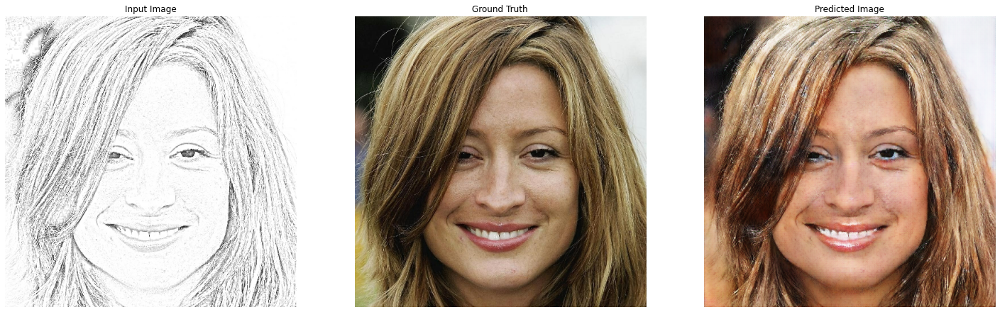

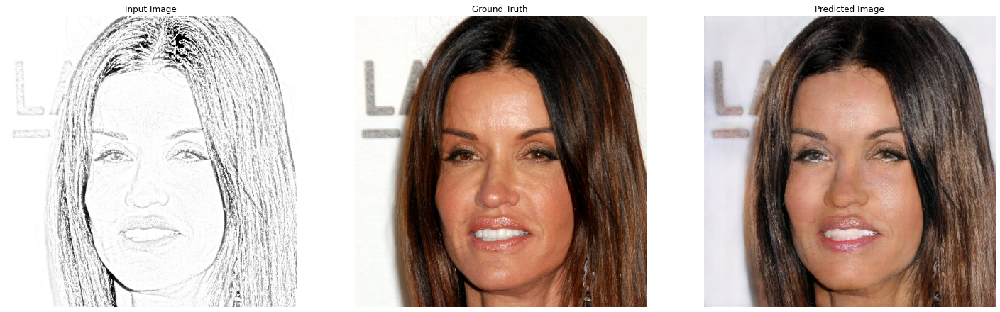

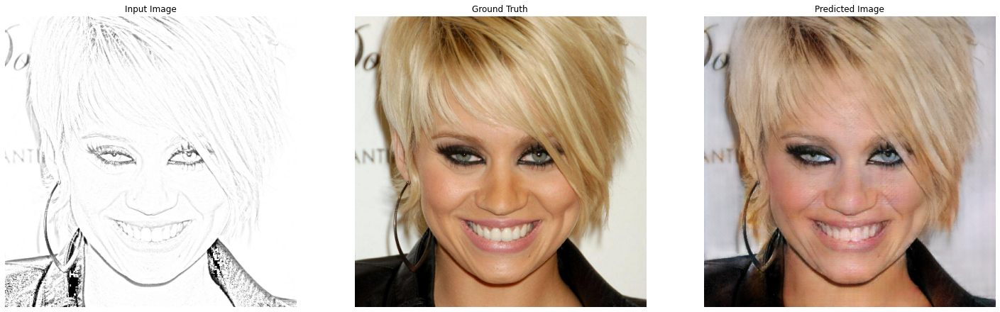

In [ ]:

for inp, tar in test_dataset.take(10):
  generate_images(generator, inp, tar)